In [1]:
import plotly.graph_objects as go
import numpy as np
import matplotlib.pyplot as plt
from amuse.community.fi.interface import Fi
from amuse.lab import Particles, nbody_system
from amuse.couple import bridge
from amuse.units import units
from amuse.community.bhtree.interface import Bhtree
from amuse.ext.sink import new_sink_particles

In [2]:
import os
os.chdir('/home/kostas/AMUSE/AMUSE_project_YESSIR/AMUSE_project_YESSIR/src')

from plotters import make_map, make_3Dmap
from molecular_cloud_initialization import *

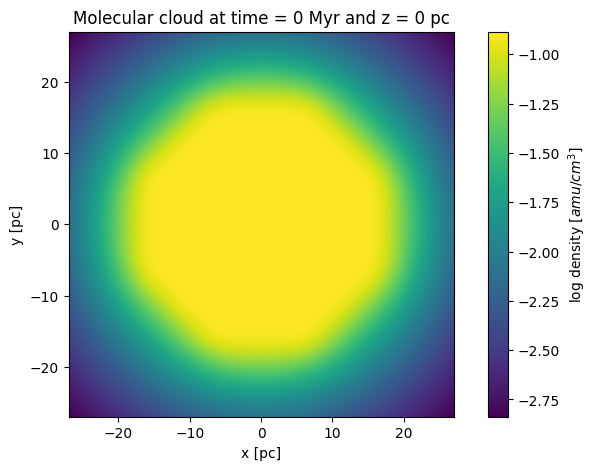

ready for evolution
Time 0.2 Myr
Time 0.4 Myr
Time 0.6 Myr
Time 0.8 Myr
Time 1.0 Myr
Time 1.2 Myr
Time 1.4 Myr
Time 1.6 Myr
Time 1.8 Myr
Time 2.0 Myr


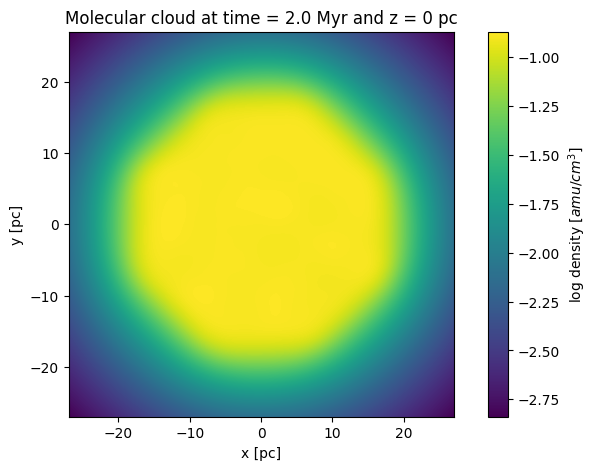

Average mass of a SPH particle 0.10362694300518081.


In [3]:
particles_cloud, converter_cloud  = make_molecular_cloud(N_cloud = 1_000,
                                                         M_cloud = 100 | units.MSun,
                                                         R_cloud = 20 | units.parsec,
                                                         seed = 1312)

particles_cloud, density_map = evolve_molecular_cloud(particles_cloud, 
                                         converter_cloud, 
                                         t_end = 2 | units.Myr, 
                                         dt = 0.2 | units.Myr, 
                                         seed = 1312)

In [4]:
# initialise the star particle set
star = Particles(1)
star.name = "star"
star.mass = 0.7 |units.MSun
star.radius = 1 | units.RSun
star.position = (-1.0, 0, 0) * (22 | units.pc)
# star.velocity = (1.0, 0, 0) * (vorb.in_(units.kms))
star.velocity = (1.0, 0, 0) * (20| units.kms)

initial_mass = 0.7 |units.MSun
converter_star = nbody_system.nbody_to_si(star.mass.sum(), 
                                   star.position.sum())

In [5]:
#initiate the gravity code with sink particles
gravity_code = Bhtree(converter_star)
gravity_code.particles.add_particles(star)

# #start the hydro code for the gas
hydro_cloud = hydro_code(Code = Fi, dt = 0.1 | units.Myr,
                         converter = converter_cloud,
                         particles = particles_cloud,
                         seed = 1312)

In [6]:
channel = {"to_star": gravity_code.particles.new_channel_to(star),
           "from_star": star.new_channel_to(gravity_code.particles),
           "to_cloud": hydro_cloud.gas_particles.new_channel_to(particles_cloud),
            "from_cloud": particles_cloud.new_channel_to(hydro_cloud.gas_particles)}

In [7]:
gravhydrobridge = bridge.Bridge(use_threading = False)
gravhydrobridge.add_system(gravity_code, (hydro_cloud,) )
gravhydrobridge.add_system(hydro_cloud, (gravity_code,) )
gravhydrobridge.timestep = 0.1 | units.Myr

In [8]:
star_position = []
cloud_density_cube = []

Collision in progress at 0.5  Myr. Now located at [-11.77298238] pc.


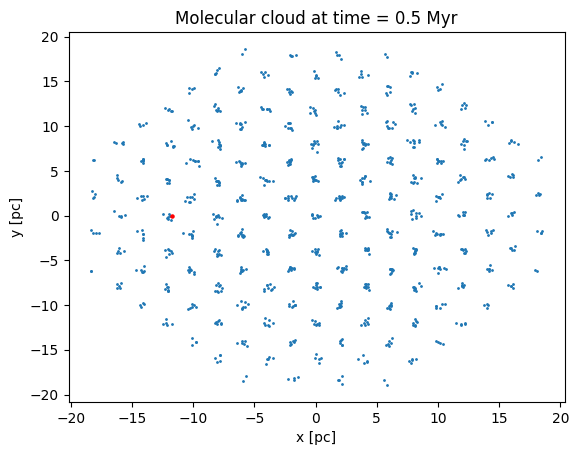

Collision in progress at 1.0  Myr. Now located at [-1.54579395] pc.


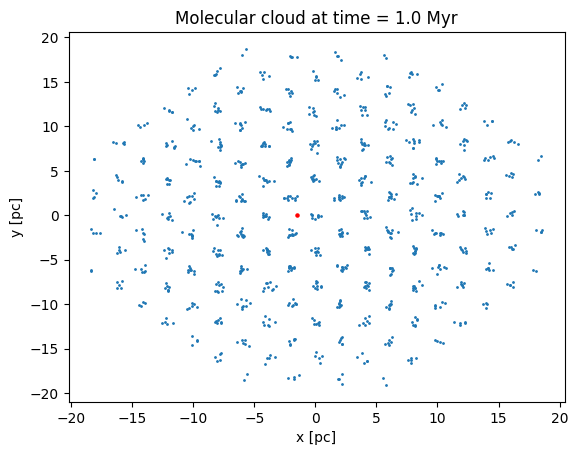

Collision in progress at 1.5  Myr. Now located at [ 8.68141674] pc.


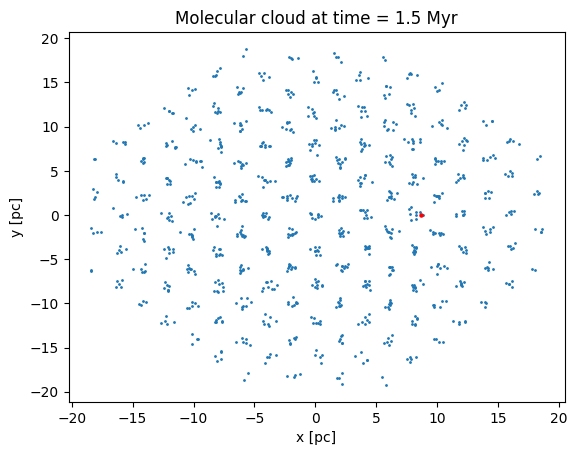

Collision in progress at 2.0  Myr. Now located at [ 18.90849879] pc.


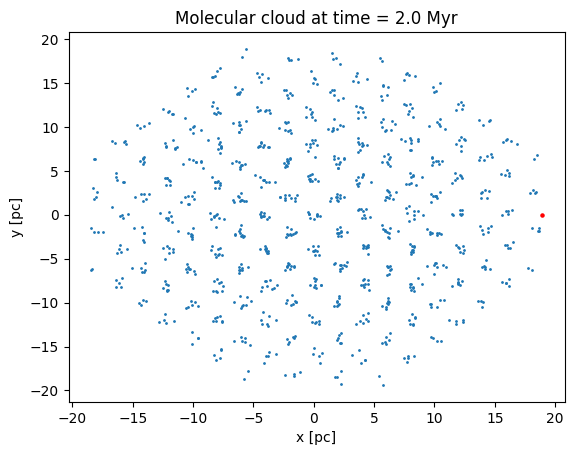

Collision in progress at 2.5  Myr. Now located at [ 29.13536708] pc.


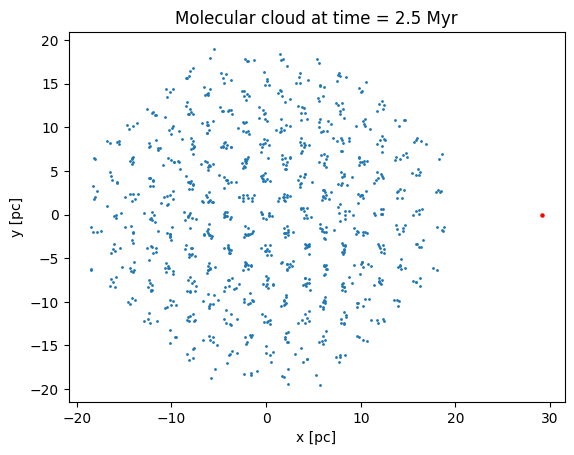

Collision in progress at 3.0  Myr. Now located at [ 39.36209623] pc.


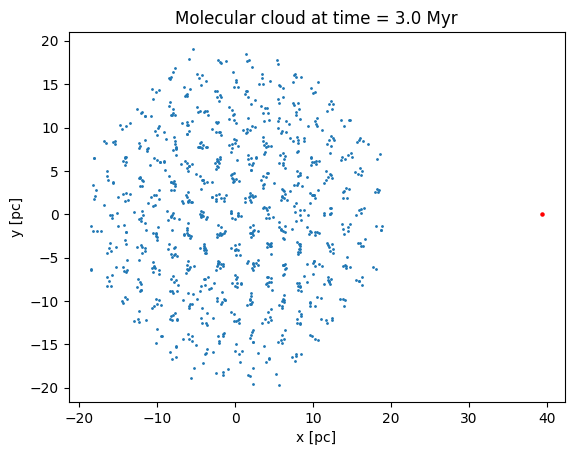

Collision in progress at 3.5  Myr. Now located at [ 49.58874997] pc.


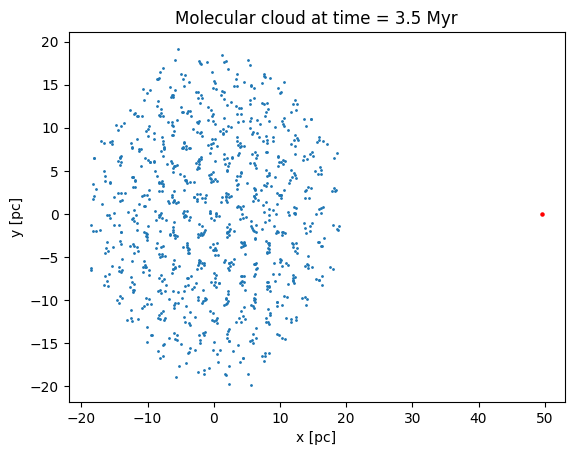

Collision in progress at 4.0  Myr. Now located at [ 59.81535717] pc.


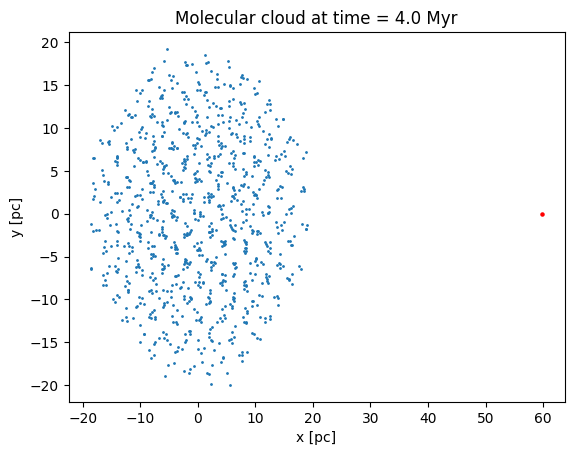

In [9]:
t_end = 4 | units.Myr
model_time = 0 | units.Myr
dt = 0.5 | units.Myr

L = 50 # length of the grid (for the plotting scheme)
N = 20 # cells in the grid (for the plotting schem)


while model_time < t_end:  
    model_time += dt
    model_time = model_time.round(1)
    
    # evolve the gravity and hydro codes through our bridge
    gravhydrobridge.evolve_model(model_time)
    
    # update channels (copy over from the codes.particles to the particle sets)
    channel["to_star"].copy()
    channel["to_cloud"].copy()

    # save the star's position on the i-th step. 
    # !!CAUTION: Values in parsecs!!
    star_position.append(star.position.value_in(units.pc)[0])
    #save the cloud's density profile on the i-th step
    # !!CAUTION: Values in amu/cm3!!
    rho,_,_,_ = make_3Dmap(hydro_cloud, L, N)
    rho= rho.value_in(units.amu/units.cm**3)
    cloud_density_cube.append(rho)
    # The positions of the cells in our grid remains the same in every iteration.
    # Save them once, during the last iteration (less memory)
    if model_time+dt > t_end:
        _, xgrid, ygrid, zgrid  = make_3Dmap(hydro_cloud, L, N)
    
    print("Collision in progress at", model_time.value_in(units.Myr), " Myr. Now located at", star.x[:10].value_in(units.pc), "pc.")
    
    plt.scatter(particles_cloud.x.value_in(units.pc), particles_cloud.y.value_in(units.pc), s = 1)
    plt.scatter(star.x.value_in(units.pc), star.y.value_in(units.pc), c = 'red', s = 5)
    plt.title("Molecular cloud at time = " + model_time.as_string_in(units.Myr))
    plt.xlabel("x [pc]")
    plt.ylabel("y [pc]")
    plt.show()

gravity_code.stop()
hydro_cloud.stop()

### What it does and How it works?
## I've got no clue
That's why there are no comments

In [75]:
fig_dict = {
    "data": [],
    "layout": {},
    "frames": []
    }

In [76]:
fig_dict["layout"]["scene"] = {
                "xaxis": {"range": [xgrid.min()-15, xgrid.max()+15],"title": "x (kpc)"},
                "yaxis": {"range": [xgrid.min()-15, xgrid.max()+15],"title": "y (kpc)"},
                "zaxis": {"range": [xgrid.min()-15, xgrid.max()+15],"title": "z (kpc)"},
                "aspectmode": "cube"
}

fig_dict["layout"]["hovermode"] = "closest"

fig_dict["layout"]["updatemenus"] = [
    {
        "buttons": [
            {
                "args": [None, {"fromcurrent": True}],
                "label": "Play",
                "method": "animate"
            },
            {
                "args": [[None], {"frame": {"duration": 0, "redraw": False},
                                  "mode": "immediate",
                                  "transition": {"duration": 0}}],
                "label": "Pause",
                "method": "animate"
            }
        ],
        "direction": "left",
        "pad": {"r": 10, "t": 87},
        "type": "buttons",
        "x": 0.1,
        "xanchor": "center",
        "y": 0,
        "yanchor": "top"
    }
]


In [77]:
steps = len(cloud_density_cube)

for i in range(steps):
    frame = {"data": []}
    X = star_position[i][0]
    Y = star_position[i][1]
    Z = star_position[i][2]

    data1 = go.Scatter3d(x=[X], y=[Y], z=[Z],
                    marker = dict(size=4, color= 'red'))

    rho = cloud_density_cube[i]

    data2 = go.Volume(
    x=xgrid.flatten(),
    y=ygrid.flatten(),
    z=zgrid.flatten(),
    value=rho.flatten(),
    isomin=rho.min(),
    isomax=rho.max(),
    opacity=0.1, # needs to be small to see through all surfaces
    surface_count=15 # needs to be a large number for good volume rendering
    )

    if i == 0:
        fig_dict["data"].append(data1)
        fig_dict["data"].append(data2)
    frame["data"].append(data1)
    frame["data"].append(data2)
    fig_dict["frames"].append(frame)


In [95]:
fig = go.Figure(fig_dict)

fig.update_layout(
    autosize=False,
    width=500,
    height=500,
    margin=dict(
        l=10,
        r=10,
        b=5,
        t=1,
        pad=4
    ),
    paper_bgcolor="whitesmoke",
)

fig.show()

In [96]:
fig.write_html("./test.html")

In [93]:

# scatter plot within the volume plot (it will later mark the star's pos)
data1 = go.Scatter3d(x=[X], y=[Y], z=[Z],
                    marker = dict(size=4, color= 'red'))

# 3D density contours of the cloud
data2 = go.Volume(
    x=xgrid.flatten(),
    y=ygrid.flatten(),
    z=zgrid.flatten(),
    value=rho.flatten(),
    isomin=rho.min(),
    isomax=rho.max(),
    opacity=0.1, # needs to be small to see through all surfaces
    surface_count=15 # needs to be a large number for good volume rendering
    )
data = [data1, data2]
fig = go.Figure(data=data)
fig.show()
